# COCO
----
convert dataset in YOLO format to COCO format

**why?**

> Because I want to try using Mediapipe Object Detection framework instead of Ultralytics.

**why?**

> Because I want to try deploy SINAR directly in raspberry pi. Unfortunately the pi's not strong enough


In [67]:
from PIL import Image
import numpy as np
import json
import os
from pathlib import Path
import cv2
from ultralytics.utils.ops import xywhn2xyxy, xyxy2ltwh
from typing import List, Dict, Any, Tuple, Union

In [75]:
# parse yaml
import yaml

cfg = yaml.safe_load(open(r"G:\My Drive\dataset\all-data.yaml"))
cfg

{'train': ['./normal-1/train',
  './normal-2/train',
  './normal-3/train',
  './normal-4/train',
  './normal-5/train',
  './geng-1/train',
  './geng-2/train',
  './geng-3/train',
  './geng-pri-1/train',
  './geng-pri-2/train',
  './geng-pri-3/train',
  './geng-pri-4/train',
  './geng-pri-5/train',
  './geng-pri-6/train'],
 'val': ['./normal-1/val',
  './normal-2/val',
  './normal-3/val',
  './normal-4/val',
  './normal-5/val',
  './geng-1/val',
  './geng-2/val',
  './geng-3/val',
  './geng-pri-1/val',
  './geng-pri-2/val',
  './geng-pri-3/val',
  './geng-pri-4/val',
  './geng-pri-5/val',
  './geng-pri-6/val'],
 'nc': 1,
 'names': ['motor']}

In [7]:
import os
os.getpid(), os.getppid(), os.cpu_count()

(19376, 19588, 12)

In [78]:
DATASET_PATH = Path(r"G:\My Drive\dataset")


def get_dataset_paths(cfg: Dict[str, Any]) -> Tuple[List[Path], List[Path]]:
    if isinstance(cfg["train"], list):
        train_paths = [DATASET_PATH / p for p in cfg["train"]]
    else:
        train_paths = [DATASET_PATH / cfg["train"]]
    if isinstance(cfg["val"], list):
        val_paths = [DATASET_PATH / p for p in cfg["val"]]
    else:
        val_paths = [DATASET_PATH / cfg["val"]]
    return train_paths, val_paths

In [82]:
tran, val = get_dataset_paths(cfg)

In [119]:
class COCO:
    def __init__(self, categories: List[str] = []) -> None:
        categories.insert(0, "background")
        self._dict = {
            "images": [],
            "annotations": [],
            "categories": [{"id": i, "name": cat} for i, cat in enumerate(categories)],
            "real_paths": []
        }
    def add_image(self, file_path: Path):
        img_id = len(self._dict["images"])
        relative_path = file_path.relative_to(DATASET_PATH)
        from_dir = relative_path.parts[0]
        file_name = f"{from_dir}_{file_path.name}"
        self._dict["images"].append({
            "id": img_id,
            "file_name": file_name,
        })
        self._dict["real_paths"].append(str(relative_path.as_posix()))
        return img_id
    
    def add_annotation(self, image_id, bbox, category_id):
        ann_id = len(self._dict["annotations"])
        self._dict["annotations"].append({
            "id": ann_id,
            "image_id": image_id,
            "bbox": bbox,
            "category_id": category_id
        })
        return ann_id
    
    def add_category(self, name):
        cat_id = len(self._dict["categories"])
        self._dict["categories"].append({
            "id": cat_id,
            "name": name
        })
        return cat_id
    
    def save(self, path):
        with open(path, "w") as f:
            json.dump(self._dict, f)
    
    def __repr__(self) -> str:
        return f"COCO({json.dumps(self._dict, indent=2)})"
    



In [122]:
cfg["names"]

['motor']

In [120]:
yolo_path = Path(r"G:\My Drive\dataset\geng-1")
train_path = yolo_path / "train"
val_path = yolo_path / "val"

# coco_labels = {
#   "categories":[
#     {"id": 0, "name": "background"},
#     {"id": 1, "name": "Motor"},
#   ],
#   "images":[],
#   "annotations":[]
# }

coco = COCO(["Motor"])

# for mode in (train_path, val_path):
mode = val_path
images = (mode / "images").glob("*.jpg")
# labels = (mode / "labels").glob("*.txt")
for img in images:
    label = mode / "labels" / (img.stem + ".txt")
    print(f"reading {img.name} with {label.name}", end=" ")
    width, height = Image.open(img).size
    print(f"({width}, {height})")
    # img_id = len(coco_labels["images"])
    # coco_labels["images"].append({"id": img_id, "file_name": img.name})
    img_id = coco.add_image(img)
    with open(label, "r") as f:
        for line in f:
            line = line.strip().split()
            x, y, w, h = [float(x) for x in line[1:]]
            # ltwh = xyxy2ltwh(xywhn2xyxy(xywh, width, height)).astype(int).tolist()
            ltwh = (x - w/2)*width, (y - h/2)*height, w*width, h*height
            coco.add_annotation(img_id, list(map(int, ltwh)), 1)
            # coco_labels["annotations"].append({
            #     "id": len(coco_labels["annotations"]) + 1,
            #     "image_id": img_id,
            #     "category_id": 1,
            #     "bbox": list(map(int, ltwh)),
            # })

reading img_03.jpg with img_03.txt (1024, 576)
reading img_04.jpg with img_04.txt (1024, 576)
reading img_05.jpg with img_05.txt (1024, 576)
reading img_06.jpg with img_06.txt (1024, 576)
reading img_25.jpg with img_25.txt (1024, 576)
reading img_26.jpg with img_26.txt (1024, 576)
reading img_27.jpg with img_27.txt (1024, 576)
reading img_28.jpg with img_28.txt (1024, 576)
reading img_38.jpg with img_38.txt (1024, 576)
reading img_39.jpg with img_39.txt (1024, 576)
reading img_40.jpg with img_40.txt (1024, 576)
reading img_41.jpg with img_41.txt (1024, 576)


In [121]:
coco._dict

{'images': [{'id': 0, 'file_name': 'geng-1_img_03.jpg'},
  {'id': 1, 'file_name': 'geng-1_img_04.jpg'},
  {'id': 2, 'file_name': 'geng-1_img_05.jpg'},
  {'id': 3, 'file_name': 'geng-1_img_06.jpg'},
  {'id': 4, 'file_name': 'geng-1_img_25.jpg'},
  {'id': 5, 'file_name': 'geng-1_img_26.jpg'},
  {'id': 6, 'file_name': 'geng-1_img_27.jpg'},
  {'id': 7, 'file_name': 'geng-1_img_28.jpg'},
  {'id': 8, 'file_name': 'geng-1_img_38.jpg'},
  {'id': 9, 'file_name': 'geng-1_img_39.jpg'},
  {'id': 10, 'file_name': 'geng-1_img_40.jpg'},
  {'id': 11, 'file_name': 'geng-1_img_41.jpg'}],
 'annotations': [{'id': 0,
   'image_id': 0,
   'bbox': [0, 360, 49, 86],
   'category_id': 1},
  {'id': 1, 'image_id': 0, 'bbox': [96, 310, 37, 62], 'category_id': 1},
  {'id': 2, 'image_id': 0, 'bbox': [181, 302, 35, 64], 'category_id': 1},
  {'id': 3, 'image_id': 0, 'bbox': [213, 277, 28, 57], 'category_id': 1},
  {'id': 4, 'image_id': 0, 'bbox': [277, 250, 24, 54], 'category_id': 1},
  {'id': 5, 'image_id': 0, 'bbox

In [118]:
(DATASET_PATH / Path(coco._dict["real_paths"][0])).is_file()

True

In [81]:
def yolo2coco(dataset_paths: List[Path], categories: List[str]) -> COCO:
    coco = COCO(categories)
    for dataset_path in dataset_paths:
        images = (dataset_path / "images").glob("*.jpg")
        for img in images:
            label = dataset_path / "labels" / (img.stem + ".txt")
            print(f"reading {img.name} with {label.name}", end=" ")
            width, height = Image.open(img).size
            print(f"({width}, {height})")
            # img_id = len(coco_labels["images"])
            # coco_labels["images"].append({"id": img_id, "file_name": img.name})
            img_id = coco.add_image(img.name)
            with open(label, "r") as f:
                for line in f:
                    line = line.strip().split()
                    x, y, w, h = [float(x) for x in line[1:]]
                    # ltwh = xyxy2ltwh(xywhn2xyxy(xywh, width, height)).astype(int).tolist()
                    ltwh = (x - w/2)*width, (y - h/2)*height, w*width, h*height
                    coco.add_annotation(img_id, list(map(int, ltwh)), 1)
    return coco

In [98]:
img.relative_to(DATASET_PATH).parts[0]

'geng-1'

In [123]:
with open("geng-1_train.json", 'r') as f:
    data = json.load(f)
data

{'images': [{'id': 0, 'file_name': 'geng-1_img_01.jpg'},
  {'id': 1, 'file_name': 'geng-1_img_02.jpg'},
  {'id': 2, 'file_name': 'geng-1_img_07.jpg'},
  {'id': 3, 'file_name': 'geng-1_img_08.jpg'},
  {'id': 4, 'file_name': 'geng-1_img_09.jpg'},
  {'id': 5, 'file_name': 'geng-1_img_10.jpg'},
  {'id': 6, 'file_name': 'geng-1_img_11.jpg'},
  {'id': 7, 'file_name': 'geng-1_img_12.jpg'},
  {'id': 8, 'file_name': 'geng-1_img_13.jpg'},
  {'id': 9, 'file_name': 'geng-1_img_14.jpg'},
  {'id': 10, 'file_name': 'geng-1_img_15.jpg'},
  {'id': 11, 'file_name': 'geng-1_img_16.jpg'},
  {'id': 12, 'file_name': 'geng-1_img_17.jpg'},
  {'id': 13, 'file_name': 'geng-1_img_18.jpg'},
  {'id': 14, 'file_name': 'geng-1_img_19.jpg'},
  {'id': 15, 'file_name': 'geng-1_img_20.jpg'},
  {'id': 16, 'file_name': 'geng-1_img_21.jpg'},
  {'id': 17, 'file_name': 'geng-1_img_22.jpg'},
  {'id': 18, 'file_name': 'geng-1_img_23.jpg'},
  {'id': 19, 'file_name': 'geng-1_img_24.jpg'},
  {'id': 20, 'file_name': 'geng-1_img_29

In [124]:
coco_images_path = Path("coco/images")
coco_images_path.mkdir(parents=True, exist_ok=True)
for img_dict, real_path in zip(data["images"], data["real_paths"]):
    img_link = coco_images_path / img_dict["file_name"]
    real_link = DATASET_PATH / real_path
    print(img_link, real_link)
    img_link.symlink_to(real_link)


coco\images\geng-1_img_01.jpg G:\My Drive\dataset\geng-1\train\images\img_01.jpg


OSError: [WinError 1314] A required privilege is not held by the client: 'G:\\My Drive\\dataset\\geng-1\\train\\images\\img_01.jpg' -> 'coco\\images\\geng-1_img_01.jpg'

In [93]:
yolo2coco(val, ["Motor"])

reading img_001.jpg with img_001.txt (704, 576)
reading img_002.jpg with img_002.txt (704, 576)
reading img_003.jpg with img_003.txt (704, 576)
reading img_004.jpg with img_004.txt (704, 576)
reading img_005.jpg with img_005.txt (704, 576)
reading img_006.jpg with img_006.txt (704, 576)
reading img_007.jpg with img_007.txt (704, 576)
reading img_008.jpg with img_008.txt (704, 576)
reading img_009.jpg with img_009.txt (704, 576)
reading img_010.jpg with img_010.txt (704, 576)
reading frame-n2-001.jpg with frame-n2-001.txt (704, 576)
reading frame-n2-002.jpg with frame-n2-002.txt (704, 576)
reading frame-n2-003.jpg with frame-n2-003.txt (704, 576)
reading frame-n2-004.jpg with frame-n2-004.txt (704, 576)
reading frame-n2-005.jpg with frame-n2-005.txt (704, 576)
reading frame-n2-006.jpg with frame-n2-006.txt (704, 576)
reading frame-n2-007.jpg with frame-n2-007.txt (704, 576)
reading frame-n2-008.jpg with frame-n2-008.txt (704, 576)
reading frame-n2-009.jpg with frame-n2-009.txt (704, 576

COCO({
    "images": [
        {
            "id": 0,
            "file_name": "img_001.jpg"
        },
        {
            "id": 1,
            "file_name": "img_002.jpg"
        },
        {
            "id": 2,
            "file_name": "img_003.jpg"
        },
        {
            "id": 3,
            "file_name": "img_004.jpg"
        },
        {
            "id": 4,
            "file_name": "img_005.jpg"
        },
        {
            "id": 5,
            "file_name": "img_006.jpg"
        },
        {
            "id": 6,
            "file_name": "img_007.jpg"
        },
        {
            "id": 7,
            "file_name": "img_008.jpg"
        },
        {
            "id": 8,
            "file_name": "img_009.jpg"
        },
        {
            "id": 9,
            "file_name": "img_010.jpg"
        },
        {
            "id": 10,
            "file_name": "frame-n2-001.jpg"
        },
        {
            "id": 11,
            "file_name": "frame-n2-002.jpg"
    

In [87]:
coco

COCO({
    "images": [
        {
            "id": 0,
            "file_name": "img_03.jpg"
        },
        {
            "id": 1,
            "file_name": "img_04.jpg"
        },
        {
            "id": 2,
            "file_name": "img_05.jpg"
        },
        {
            "id": 3,
            "file_name": "img_06.jpg"
        },
        {
            "id": 4,
            "file_name": "img_25.jpg"
        },
        {
            "id": 5,
            "file_name": "img_26.jpg"
        },
        {
            "id": 6,
            "file_name": "img_27.jpg"
        },
        {
            "id": 7,
            "file_name": "img_28.jpg"
        },
        {
            "id": 8,
            "file_name": "img_38.jpg"
        },
        {
            "id": 9,
            "file_name": "img_39.jpg"
        },
        {
            "id": 10,
            "file_name": "img_40.jpg"
        },
        {
            "id": 11,
            "file_name": "img_41.jpg"
        }
    ],
    "anno

In [10]:
#@title Visualize the training dataset
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import patches, text, patheffects
from collections import defaultdict
import math

def draw_outline(obj):
  obj.set_path_effects([patheffects.Stroke(linewidth=4,  foreground='black'), patheffects.Normal()])
def draw_box(ax, bb):
  patch = ax.add_patch(patches.Rectangle((bb[0],bb[1]), bb[2], bb[3], fill=False, edgecolor='red', lw=2))
  draw_outline(patch)
def draw_text(ax, bb, txt, disp):
  text = ax.text(bb[0],(bb[1]-disp),txt,verticalalignment='top'
  ,color='white',fontsize=10,weight='bold')
  draw_outline(text)
def draw_bbox(ax, annotations_list, id_to_label, image_shape):
  for annotation in annotations_list:
    cat_id = annotation["category_id"]
    bbox = annotation["bbox"]
    draw_box(ax, bbox)
    draw_text(ax, bbox, id_to_label[cat_id], image_shape[0] * 0.05)
def visualize(dataset_folder, max_examples=None):
  with open(os.path.join(dataset_folder, "labels.json"), "r") as f:
    labels_json = json.load(f)
  images = labels_json["images"]
  cat_id_to_label = {item["id"]:item["name"] for item in labels_json["categories"]}
  image_annots = defaultdict(list)
  for annotation_obj in labels_json["annotations"]:
    image_id = annotation_obj["image_id"]
    image_annots[image_id].append(annotation_obj)

  if max_examples is None:
    max_examples = len(image_annots.items())
  n_rows = math.ceil(max_examples / 3)
  fig, axs = plt.subplots(n_rows, 3, figsize=(24, n_rows*8)) # 3 columns(2nd index), 8x8 for each image
  for ind, (image_id, annotations_list) in enumerate(list(image_annots.items())[:max_examples]):
    ax = axs[ind//3, ind%3]
    img = plt.imread(os.path.join(dataset_folder, "images", images[image_id]["file_name"]))
    ax.imshow(img)
    draw_bbox(ax, annotations_list, cat_id_to_label, img.shape)
  plt.show()

# train_dataset_path = Path(r"G:\My Drive\dataset\geng-1\train")


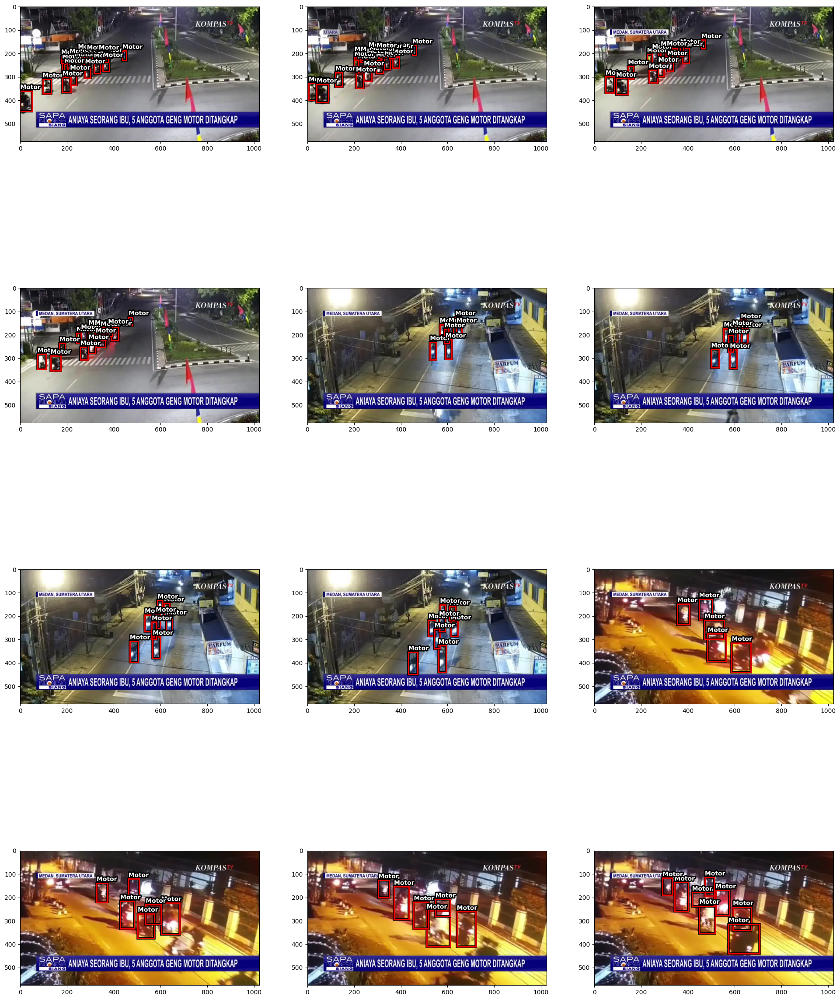

In [20]:
visualize(val_path, 12)

In [51]:
coco_labels["annotations"][0]["bbox"]

[24, 373, 44, 81]

In [ ]:
width, height = Image.open(img).size


In [55]:
width, height

(1024, 576)

In [76]:
x, y, w, h = list(map(float,line[1:]))
x, y, w, h

(0.303223, 0.297743, 0.051758, 0.161458)

In [78]:
x1, y1, w1, h1 = list(map(int, ((x - w/2)*width, (y - h/2)*height, w*width, h*height)))
x1, y1, w1, h1

(284, 125, 53, 92)

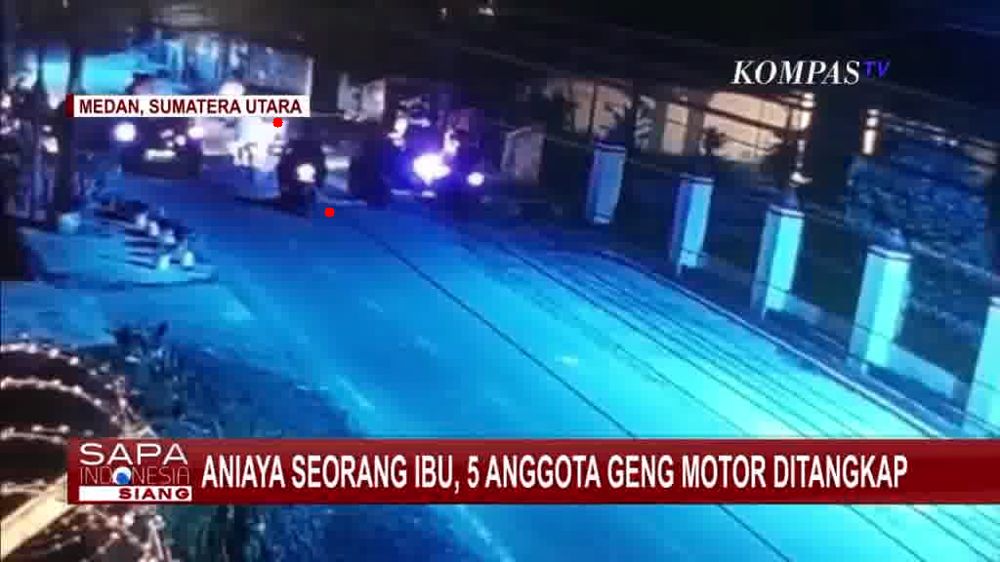

In [81]:


frame = cv2.imread(str(img))
cv2.circle(frame, (x1, y1), 5, (255, 0,0), -1)
cv2.circle(frame, (x1 + w1, y1 + h1), 5, (255, 0, 0), -1)

Image.fromarray(frame)

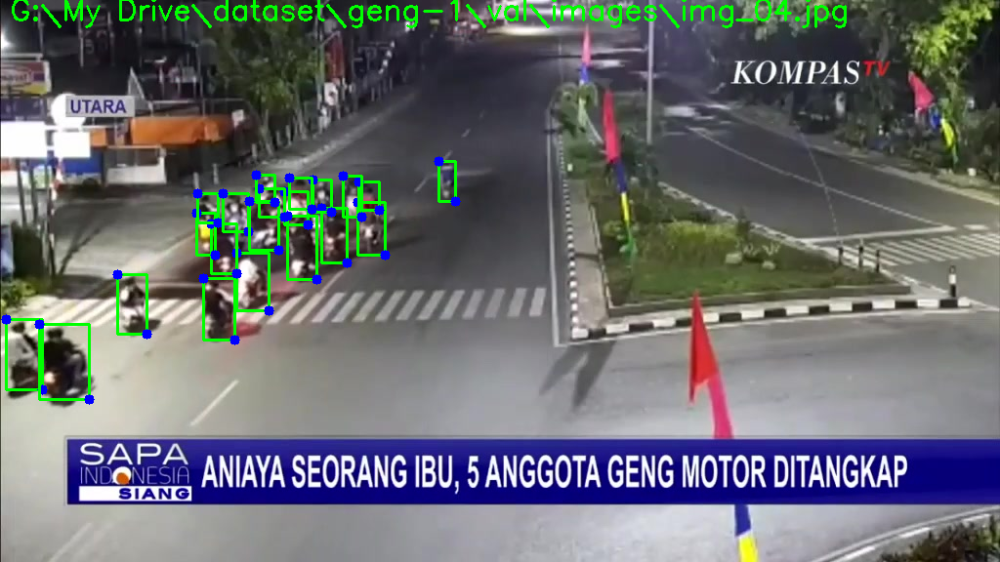

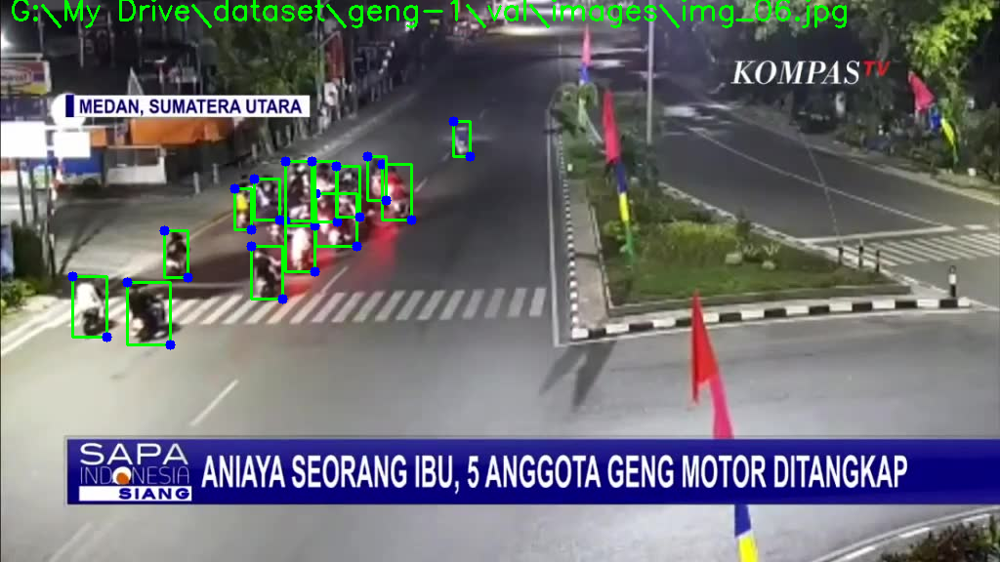

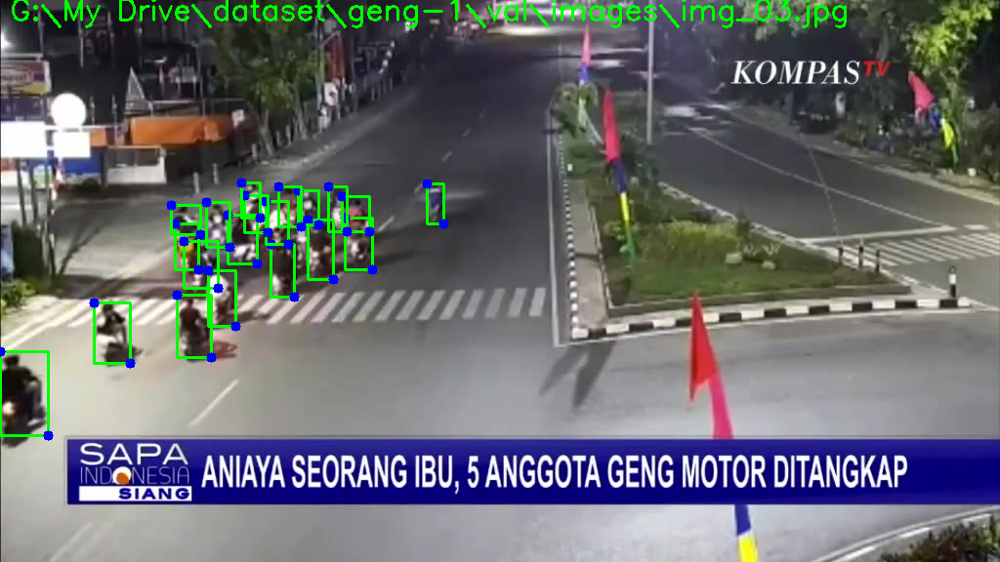

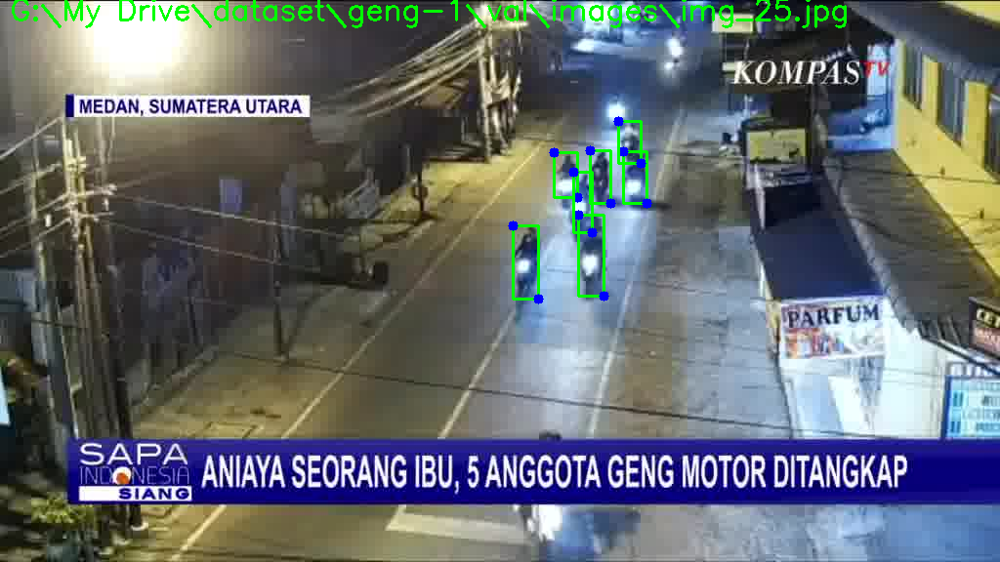

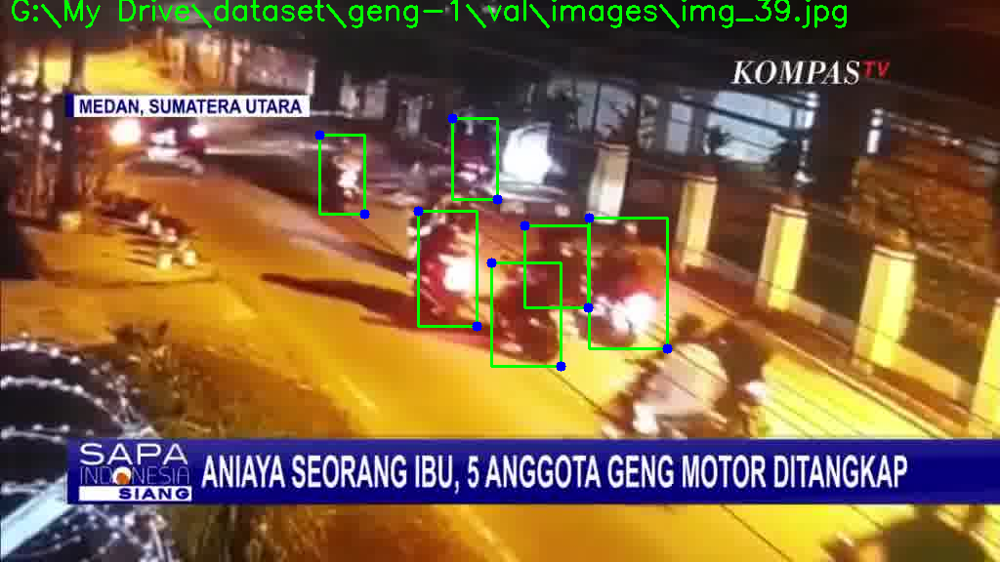

...

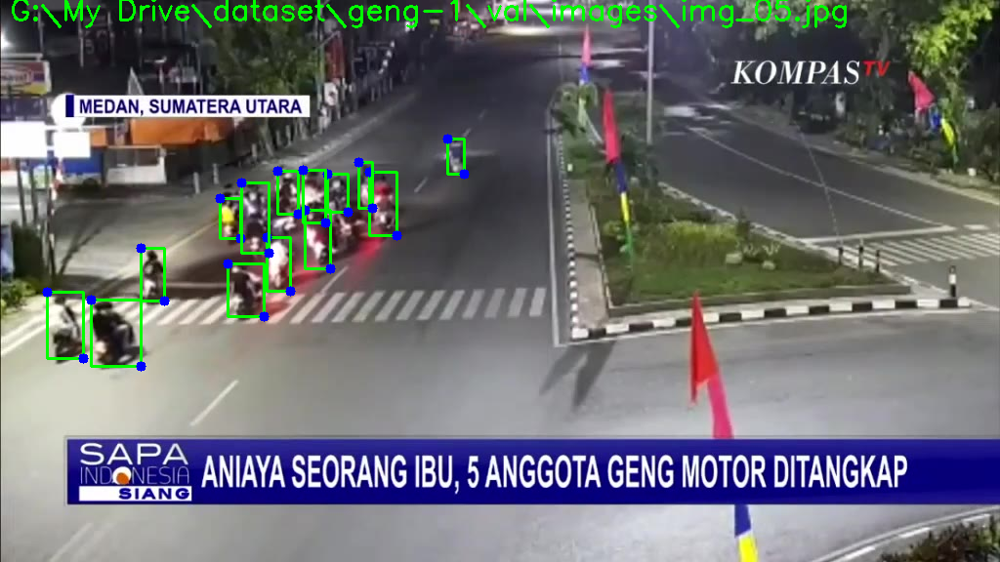

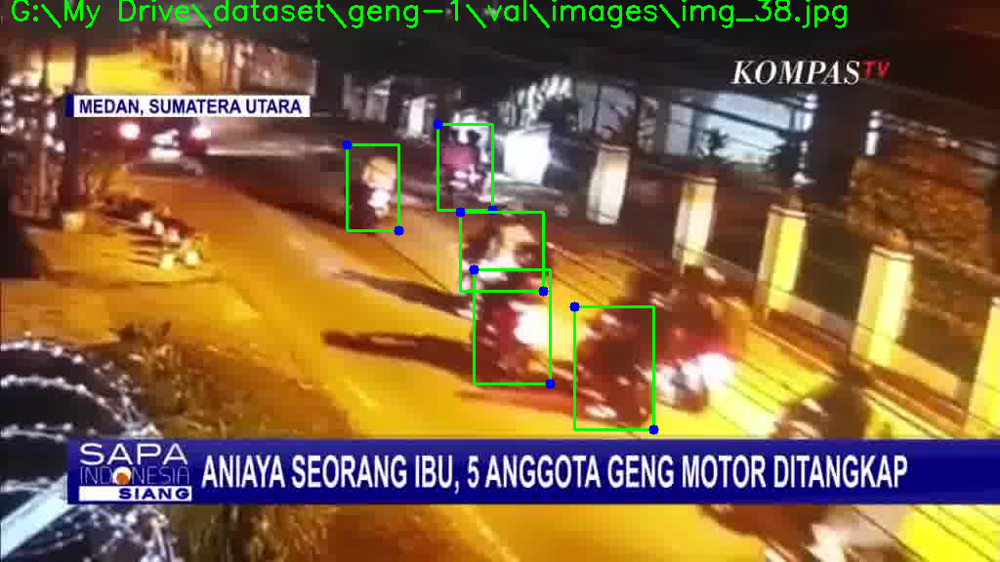

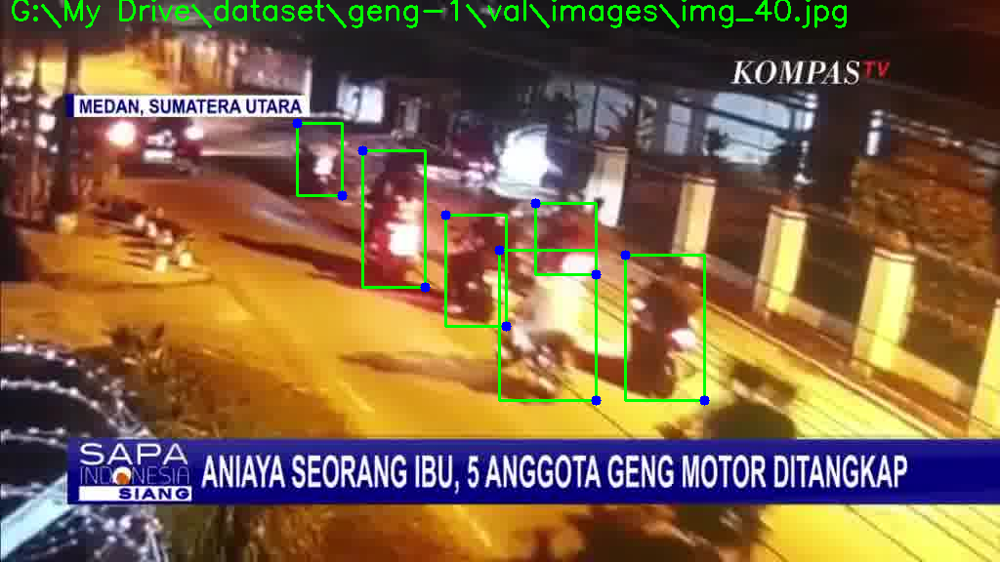

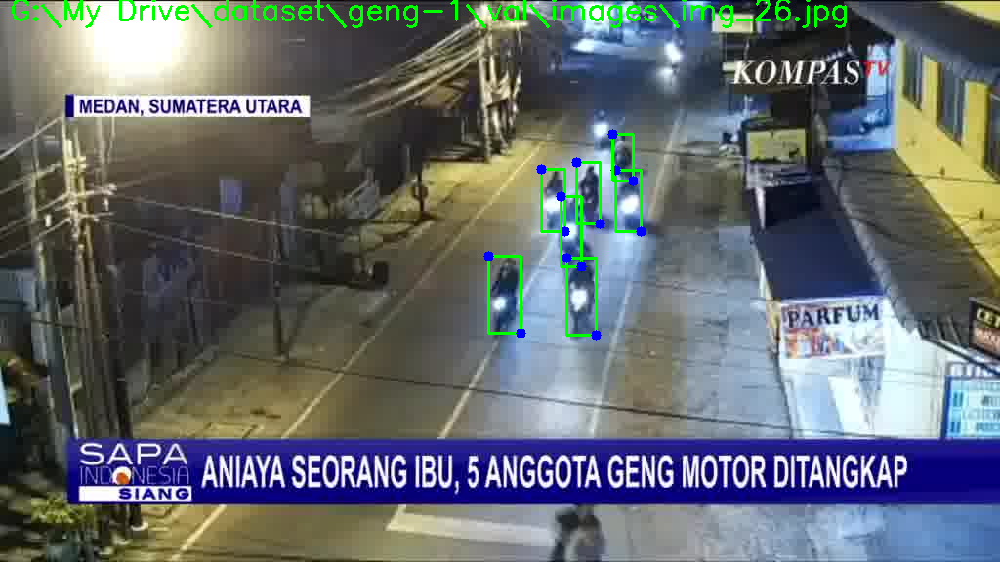

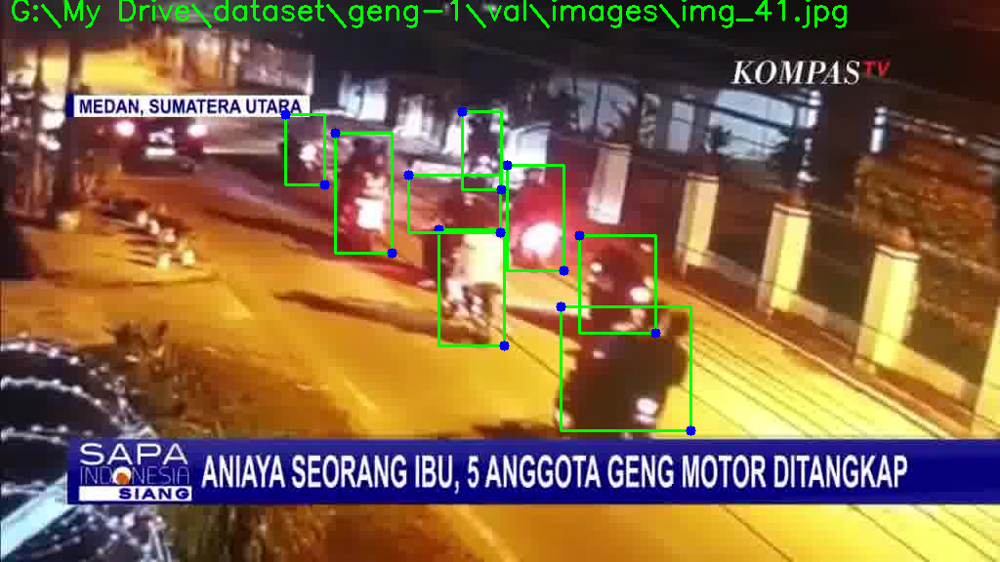

In [15]:
import random

sample_imgs = random.sample(coco_labels["images"], 12)

for img in sample_imgs:
    img_path = val_path / "images" / img["file_name"]
    frame = cv2.imread(str(img_path))
    annotations = [annot for annot in coco_labels["annotations"] if annot["image_id"] == img["id"]]
    for annot in annotations:
        x, y, w, h = annot["bbox"]
        cv2.putText(frame, f"{str(img_path)}", (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.circle(frame, (x, y), 5, (255, 0,0), -1)
        cv2.circle(frame, (x + w, y + h), 5, (255, 0, 0), -1)
    display(Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)))